# End-to-end AI-Driven Dog Breed Classifier

This notebook was created to be a multi class image classifier in regards to dog breeds using TensorFlow 2.x and TensorFlowhub.

## 1. Problem

Identifying a breed of a dog given an image of a dog.

When I am at a place where there is a dog, I would like to take a photo of that dog and know what kind of breed it is.

## 2. Data

The data that we are using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview


## 4.Features

Some information about the data:
* We are dealing with images (unstructured data) so it is probably best we use deep learning/ transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set
(these images have labels).
* There are around 10,000+ images in the test set
(these images have no labels, because we will want to predict them).

## Get our workspace ready
* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we are using a GPU

In [ ]:
#!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

Archive:  /content/drive/MyDrive/Dog Vision/dog-breed-identification.zip
replace drive/MyDrive/Dog Vision/labels.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [2]:
pip install tensorflow==2.15.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 73.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 50.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 88.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 38.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.9 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.0
    Uninstalling ml-dtypes-0.4.0:
      Successfully uninstalled ml-dtypes-0.4.0
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: tensorboard
    Found existing installation

In [2]:
# Import TensorFlow into Colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.17.0


In [2]:
# Import TensorFlow Hub
import tensorflow_hub as hub
print("TF_hub version:", hub.__version__)

TF_hub version: 0.16.1


In [3]:
#Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


# Getting the data ready to turn into Tensors

I will need to first turn all my data into a numerical format since that is what machine learning models are able to understand.

I will start by acessing our data and also checking out the labels.

In [4]:
import pandas as pd
labels_read = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_read.describe())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [5]:
labels_read.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


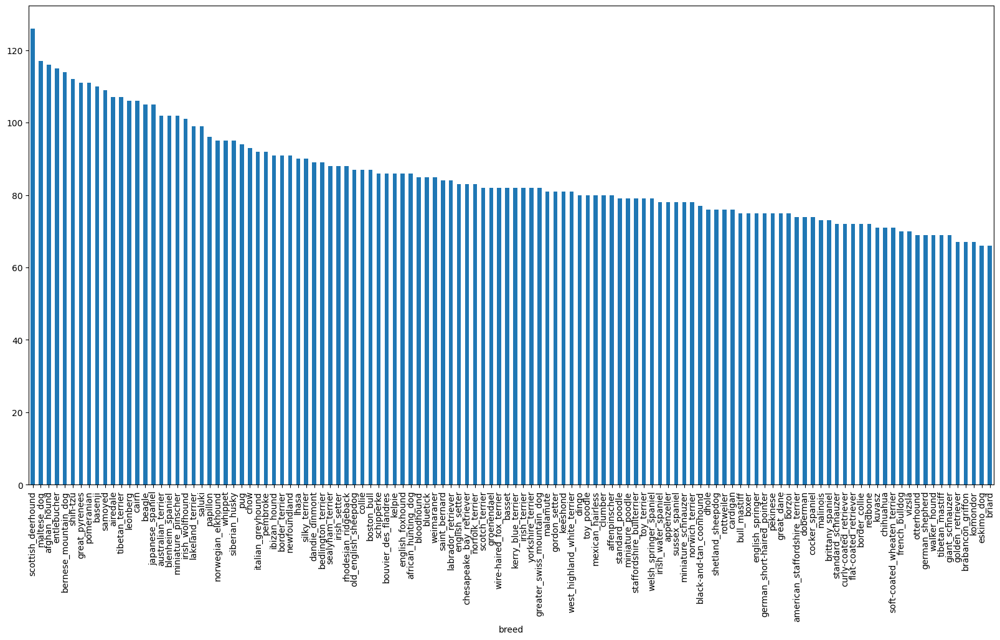

In [6]:
# How many images are there of each breed

labels_read["breed"].value_counts().plot.bar(figsize = (20,10));

In [7]:
labels_read["breed"].value_counts().mean()

85.18333333333334

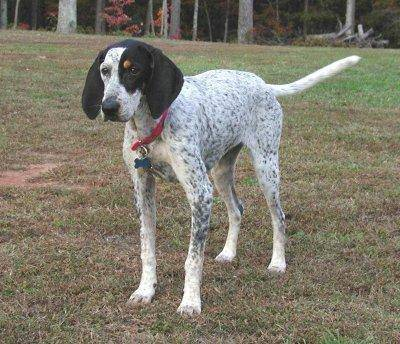

In [8]:
# Viewing an image
from IPython.display import Image

Image("/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

### Getting the images and their labels

I will be getting all the image file pathnames.

In [9]:
len(labels_read)

10222

In [10]:
# Create pathnames from image ID's
filenames = ["/content/drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_read["id"]]

# Check the first 10 filenames
filenames[:10]

['/content/drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
# We will check to see if filenames match number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("It matches")
else:
  print("Does not match")

It matches


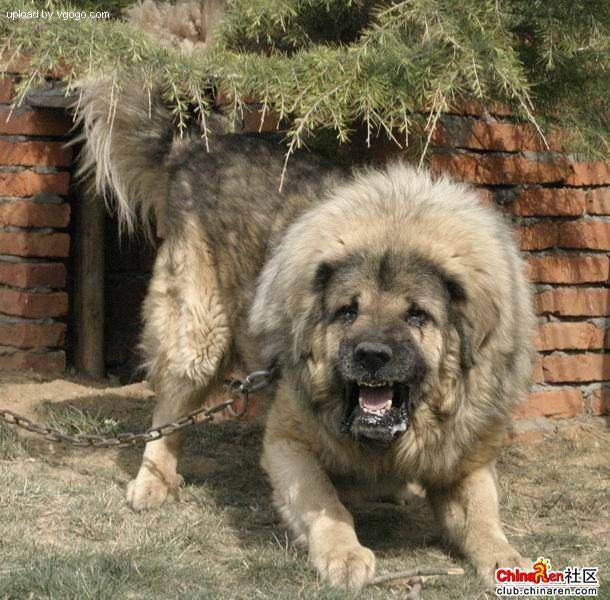

In [12]:
Image(filenames[9000])

The training image filepaths are now in a list, we will now be able to prepare the labels that we will be using

In [13]:
import numpy as np
labels = labels_read["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
if len(labels) == len(filenames):
  print("They match")
else:
  print("Number of labels does not match")

They match


In [15]:
#Find the unique labels values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [16]:
# Turn a single label into an array of booleans

print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [17]:
# Lets now turn every label into an arrray of booleans

boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
#Turning a boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])[0][0]) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### I will be creating a validaton set

In [19]:
# Setting the x and y variables
x = filenames
y = boolean_labels

I will be first using 1000 images and then increasing as needed

In [20]:
# Set number of images to use for the experimentation process

NUM_IMG = 1000 #@param {type:"slider", min:1000, max:10000,step:1000}

In [21]:
# Splitting data into train and validation sets

from sklearn.model_selection import train_test_split

x_train,x_val,y_train,y_val = train_test_split(x[:NUM_IMG],y[:NUM_IMG], test_size=0.2, random_state = 42)

len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

In [22]:
x_train[:2],y_train[:2]

(['/content/drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fals

## I will be turning images into Tensors

I will be writing a function that does a few things:

1. Take an image filepath as input
2. I will use Tensorflow to read the file and save it to a variable, `image`
3. I will turn the `image` into Tensors
4. Normalize our image from 0-255 to 0-1
5. I will resize the `image` to be a shape of (224,224)
6. I will return the modified `image`



In [23]:
# Convrting and image to NumPy array

from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [24]:
#turn an image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [25]:
from itertools import chain
# Define image size

IMG_SIZE = 224

# Create a function for preprocessing images
def process(image_path, img_size = IMG_SIZE):
  """
  Takes an image filepath and turns into a tensor
  """

  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image,channels = 3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image,size = [IMG_SIZE,IMG_SIZE])

  return image


## Turning the data into batches

In [26]:
def get_image_label(image_path,label):
  image = process(image_path)
  return image,label

I have now turned the data into tuples of Tensors in the form of (image,labels). I will now create a function to convert all the data into tuples

In [85]:
BATCH_SIZE = 32

def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  # If the data is a test dataset, we will most likely not have labels
  if test_data:
    print("Creating the test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process).batch(BATCH_SIZE)
    return data_batch

  # If the data if a valid dataset, we will not need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [28]:
train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val,y_val, valid_data = True)

Creating training data batches...
Creating validation data batches...


In [29]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [30]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

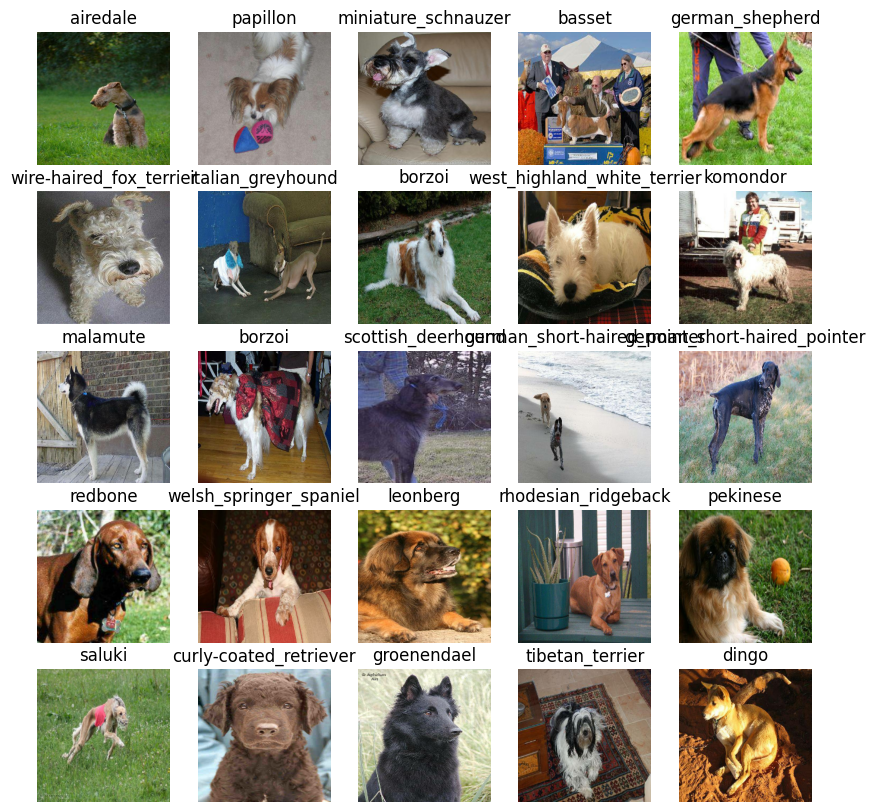

In [31]:
#Visualize training images from the train batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

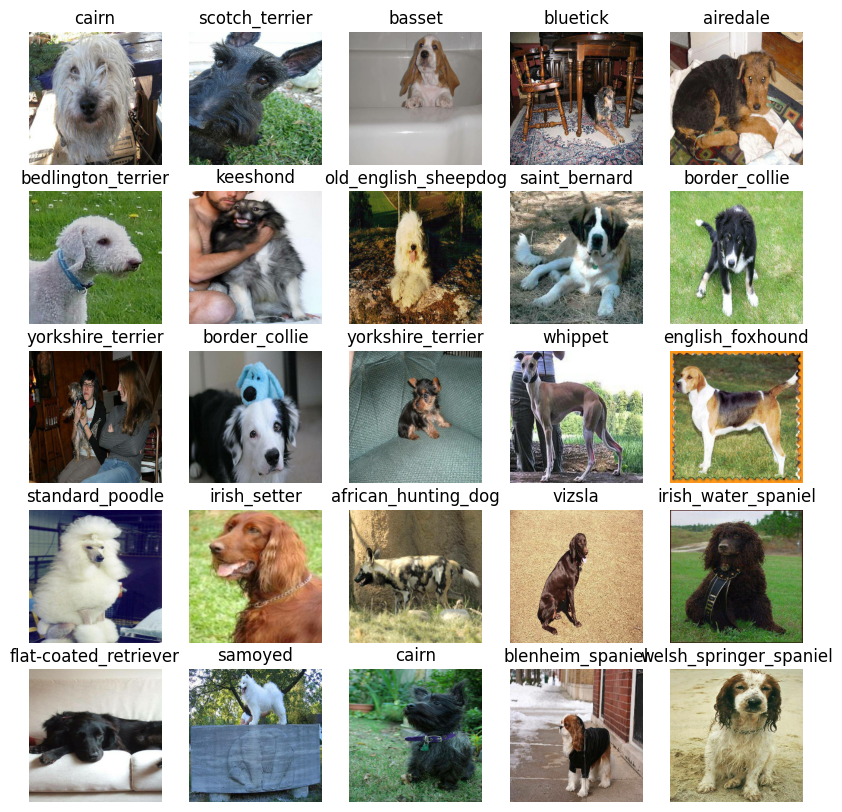

In [32]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

### Building the model

The link is from Kaggle models:
https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true


In [33]:
# Setting the input shape

INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

OUTPUT_SHAPE = len(unique_breeds)

MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"


In [34]:
INPUT_SHAPE

[None, 224, 224, 3]

I have now created the inputs, outputs, and model. I will now be utilizing the Keras deep learning model to put them all together

In [35]:
# Creating a function that creates the Keras model
def model_create(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building the model using", MODEL_URL)
#setup model
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), #input layer
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
      activation = "softmax")#output layer
  ])

  #Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  model.build(INPUT_SHAPE)

  return model

In [36]:
model = model_create()
model.summary()


Building the model using https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [37]:
outputs = np.ones(shape = (1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating Callbacks
Callback are helper functions a model can use during training to do such thungs as save its progress, check its progress or stop training early if a model stops improving.

In [38]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [39]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [40]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [41]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [43]:
# Check to make sure we're still running on a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


In [46]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = model_create()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [47]:
# Fit the model to the data
model = train_model()

Building the model using https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 163s 6s/step - loss: 4.6382 - accuracy: 0.0950 - val_loss: 3.4959 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 5s 201ms/step - loss: 1.6823 - accuracy: 0.6725 - val_loss: 2.2111 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 4s 156ms/step - loss: 0.5818 - accuracy: 0.9300 - val_loss: 1.7143 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 4s 178ms/step - loss: 0.2612 - accuracy: 0.9837 - val_loss: 1.5178 - val_accuracy: 0.5850
Epoch 5/100
25/25 [==============================] - 5s 207ms/step - loss: 0.1542 - accuracy: 0.9912 - val_loss: 1.4188 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 4s 158ms/step - loss: 0.1032 - accuracy: 1.0000 - val_loss: 1.3811 - val_accuracy: 0.6200
Epoch 7/100
25/25 [============

**Checking the TensorBoard logs**

The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.

In [48]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs


<IPython.core.display.Javascript object>

Making and evaluating predictions using a trained model

In [49]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [50]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 44s 112ms/step


array([[8.6014485e-04, 1.1080729e-05, 3.5251328e-04, ..., 7.3342002e-04,
        4.0336640e-06, 2.6257392e-03],
       [6.5309217e-04, 9.1467162e-05, 4.9608806e-03, ..., 1.4286661e-04,
        7.2674808e-04, 5.7649664e-05],
       [1.8445721e-06, 2.1540673e-06, 5.4320212e-06, ..., 3.5571206e-06,
        9.9405770e-06, 9.4552624e-06],
       ...,
       [6.8434025e-07, 2.5602674e-05, 8.2081569e-06, ..., 1.0827577e-05,
        1.6854650e-04, 8.3581122e-05],
       [1.2020271e-02, 1.7183441e-04, 8.9854402e-05, ..., 7.2546449e-05,
        2.9634482e-05, 4.1100506e-02],
       [3.4009057e-04, 5.1707120e-05, 6.1885879e-04, ..., 2.3298205e-03,
        2.2281287e-04, 3.1134339e-05]], dtype=float32)

In [51]:
predictions[0]

array([8.60144850e-04, 1.10807287e-05, 3.52513278e-04, 1.13072965e-05,
       3.94910050e-04, 1.93513970e-05, 8.51529185e-03, 8.89433548e-04,
       2.12128125e-05, 5.64832124e-04, 3.08072304e-05, 1.81088937e-04,
       5.57863932e-05, 1.86916259e-05, 7.75794440e-04, 4.32161069e-05,
       6.94662958e-05, 1.79496452e-01, 8.94016830e-06, 3.79630619e-05,
       3.17888567e-04, 3.00728971e-05, 3.74090559e-05, 7.54977809e-04,
       6.47060369e-06, 3.11840879e-04, 2.10386634e-01, 4.73316213e-05,
       1.13341419e-04, 9.09834998e-05, 3.76834396e-05, 2.70673918e-04,
       6.47445850e-05, 4.03750309e-05, 1.72882301e-05, 6.25612140e-02,
       6.78937749e-06, 2.59299122e-04, 4.26559600e-05, 9.74226350e-05,
       1.33601570e-04, 1.27460953e-05, 1.20856763e-04, 7.41896947e-05,
       2.61319965e-05, 5.28782293e-05, 3.14652948e-06, 5.04279218e-04,
       2.44686642e-04, 6.22899170e-05, 1.37031806e-04, 4.36693917e-05,
       7.19476593e-05, 2.05539673e-05, 5.32809609e-05, 1.23170466e-05,
      

In [52]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[6.98512304e-05 6.82814934e-05 5.08011362e-05 2.46086071e-04
 3.28742107e-03 1.07824620e-04 1.65549689e-04 8.98129540e-04
 1.08470060e-02 1.57401841e-02 5.17191802e-05 1.91141025e-05
 5.90720039e-04 5.10393362e-03 7.14438793e-04 1.29992445e-03
 3.62478168e-05 1.28088141e-04 1.77136433e-04 4.45069803e-04
 3.11052136e-05 4.90419799e-04 5.73021534e-05 1.01858886e-05
 1.34470863e-02 1.15912269e-04 1.96878154e-05 9.46350774e-05
 8.20111309e-05 5.59816981e-05 8.89277071e-05 2.69451302e-05
 1.98773414e-05 7.38178232e-06 9.86008126e-06 3.73233343e-05
 9.89723267e-05 1.02308913e-04 3.86781066e-05 1.90030798e-01
 1.35775073e-04 6.03011540e-05 2.62290612e-03 3.94623885e-06
 1.43715792e-04 1.03849843e-05 4.79653136e-05 3.66702821e-04
 2.40895988e-05 1.91301253e-04 3.71207861e-05 1.80944451e-04
 3.38549959e-04 8.29085591e-04 2.01033290e-05 1.97541769e-04
 2.05813394e-05 1.23855178e-04 6.15474564e-05 1.26680598e-05
 9.53178387e-05 3.29483941e-04 1.84494165e-05 6.07678066e-06
 2.83740901e-05 1.149385

In [53]:
unique_breeds[113]

'walker_hound'

In [54]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [55]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [56]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.

* Convert the prediction probabilities to a predicted label.

* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [57]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

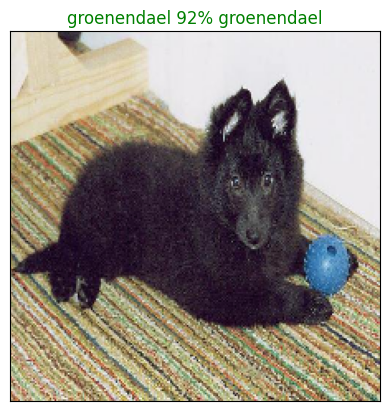

In [58]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [59]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

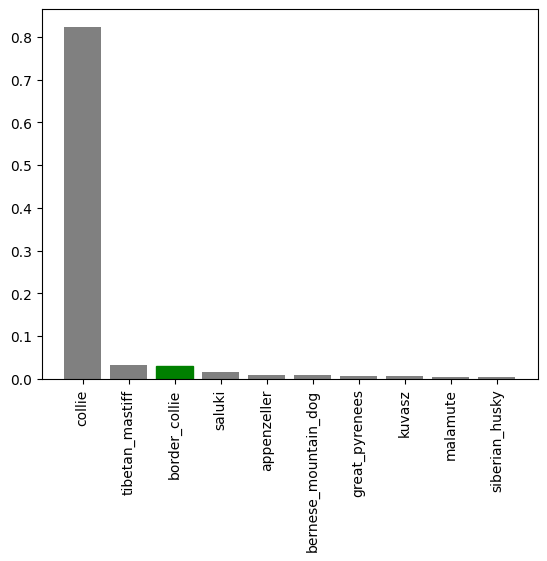

In [60]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our modle, I will be showing a few of them

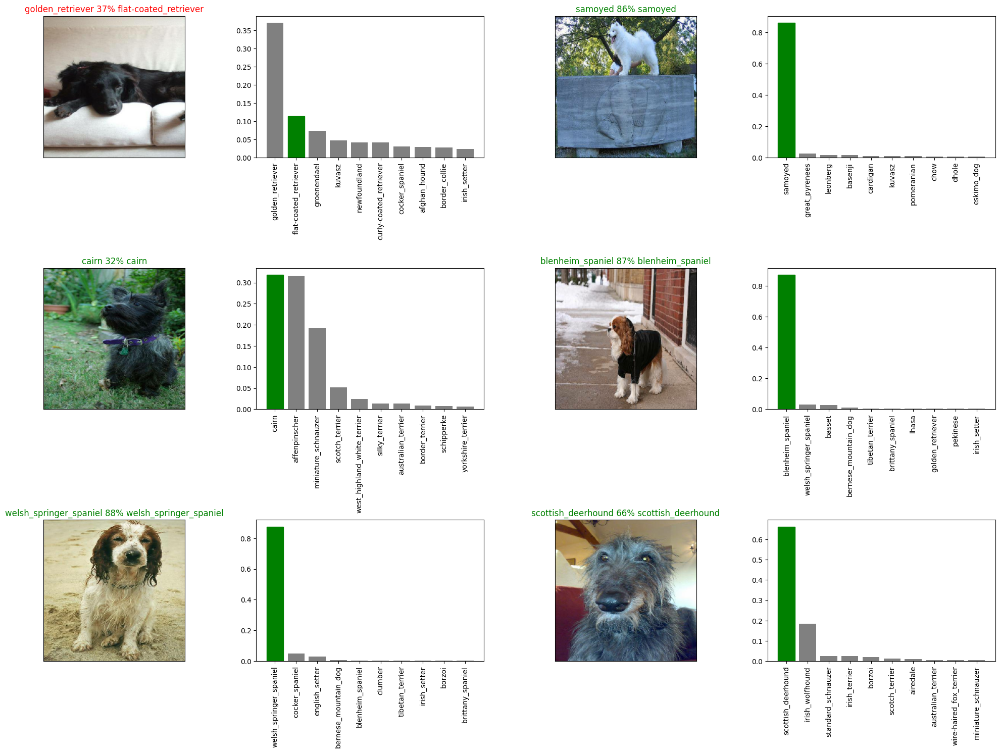

In [61]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [62]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [63]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [65]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Kamalesh")

Saving model to: drive/My Drive/Dog Vision/models/20240812-06051723442748-1000-images-mobilenetv2-Kamalesh.h5...


'drive/My Drive/Dog Vision/models/20240812-06051723442748-1000-images-mobilenetv2-Kamalesh.h5'

In [67]:
loaded_1000_image_model = load_model('drive/My Drive/Dog Vision/models/20240812-06051723442748-1000-images-mobilenetv2-Kamalesh.h5')


Loading saved model from: drive/My Drive/Dog Vision/models/20240812-06051723442748-1000-images-mobilenetv2-Kamalesh.h5


In [68]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 163ms/step - loss: 1.2374 - accuracy: 0.6600


[1.2374439239501953, 0.6600000262260437]

In [69]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 3s 259ms/step - loss: 1.2374 - accuracy: 0.6600


[1.2374439239501953, 0.6600000262260437]

In [71]:
len(x), len(y)

(10222, 10222)

In [73]:
# Create a data batch with the full data set
full_data = create_data_batches(x, y)

Creating training data batches...


In [74]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [76]:
# Create a model for full model
full_model = model_create()

Building the model using https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [77]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [78]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1423s 4s/step - loss: 1.3402 - accuracy: 0.6715
Epoch 2/100
320/320 [==============================] - 43s 135ms/step - loss: 0.4058 - accuracy: 0.8782
Epoch 3/100
320/320 [==============================] - 45s 141ms/step - loss: 0.2408 - accuracy: 0.9344
Epoch 4/100
320/320 [==============================] - 43s 135ms/step - loss: 0.1559 - accuracy: 0.9617
Epoch 5/100
320/320 [==============================] - 43s 133ms/step - loss: 0.1063 - accuracy: 0.9778
Epoch 6/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0751 - accuracy: 0.9862
Epoch 7/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0592 - accuracy: 0.9918
Epoch 8/100
320/320 [==============================] - 44s 137ms/step - loss: 0.0466 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0387 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 41s 128ms

In [80]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Kamalesh")


Saving model to: drive/My Drive/Dog Vision/models/20240812-06511723445485-full-image-set-mobilenetv2-Kamalesh.h5...


'drive/My Drive/Dog Vision/models/20240812-06511723445485-full-image-set-mobilenetv2-Kamalesh.h5'

In [81]:
loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20240812-06511723445485-full-image-set-mobilenetv2-Kamalesh.h5')


Loading saved model from: drive/My Drive/Dog Vision/models/20240812-06511723445485-full-image-set-mobilenetv2-Kamalesh.h5


**Making predictions on the test dataset**

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

This is why I created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

In [82]:
# Load test image filenames
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/df58b248e14af15c43fb4a3ebc00e9a3.jpg',
 'drive/My Drive/Dog Vision/test/dce8d03553ab29570f67a28bf0ee0709.jpg',
 'drive/My Drive/Dog Vision/test/e12731c30619c3fa4b0d9d9a76fb9d60.jpg',
 'drive/My Drive/Dog Vision/test/e1f25b73300a49b61a7690239fe37b38.jpg',
 'drive/My Drive/Dog Vision/test/e292584f17fa7cea7f95bdadecde0ebb.jpg',
 'drive/My Drive/Dog Vision/test/e76a7a1d23d687b5015b07df762c0c10.jpg',
 'drive/My Drive/Dog Vision/test/e381c5fcf1420985b20117e4bc7d38cd.jpg',
 'drive/My Drive/Dog Vision/test/e090f0f0ebc83ddf5f649a841493868b.jpg',
 'drive/My Drive/Dog Vision/test/e7afcce6e45858fc3b294cc5c0b15a53.jpg',
 'drive/My Drive/Dog Vision/test/e4cffb02169d9b46810d50c6b9eae28d.jpg']

In [83]:
len(test_filenames)

10357

In [86]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating the test data batches...


In [87]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [89]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1596s 5s/step


In [91]:
# Save predictions
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [92]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [93]:
test_predictions[:10]


array([[7.32889414e-01, 1.22534627e-09, 1.14222459e-07, ...,
        1.42142653e-09, 8.74657587e-07, 1.68877348e-01],
       [1.26326738e-09, 5.47076924e-12, 2.11498557e-13, ...,
        8.93210159e-12, 2.33084698e-08, 2.30880419e-11],
       [3.95562338e-09, 3.01511989e-07, 1.36479477e-08, ...,
        5.85387916e-08, 1.93994219e-06, 7.73628653e-06],
       ...,
       [3.39241239e-11, 3.65452157e-09, 9.73986558e-10, ...,
        9.83130008e-07, 4.32119896e-06, 3.49585083e-10],
       [2.89865714e-02, 8.23717627e-09, 1.77717466e-10, ...,
        5.45080758e-10, 8.10982659e-09, 9.04185669e-08],
       [1.44692253e-11, 4.43196563e-10, 6.20156460e-14, ...,
        2.87611688e-11, 4.26935961e-12, 8.47674084e-11]])

In [94]:
test_predictions.shape


(10357, 120)

**Preparing test dataset predictions for Kaggle**

Looking at the Kaggle sample submission, we find that it wants my model prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

In [95]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [96]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [97]:
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df58b248e14af15c43fb4a3ebc00e9a3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dce8d03553ab29570f67a28bf0ee0709,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e12731c30619c3fa4b0d9d9a76fb9d60,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e1f25b73300a49b61a7690239fe37b38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e292584f17fa7cea7f95bdadecde0ebb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [98]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df58b248e14af15c43fb4a3ebc00e9a3,7.328894e-01,1.225346e-09,1.142225e-07,2.670501e-10,2.924322e-12,2.680177e-09,9.408815e-07,4.945023e-10,2.496068e-11,...,3.594270e-07,4.545330e-05,4.675672e-09,1.517853e-09,1.845983e-08,2.220309e-10,5.034901e-08,1.421427e-09,8.746576e-07,1.688773e-01
1,dce8d03553ab29570f67a28bf0ee0709,1.263267e-09,5.470769e-12,2.114986e-13,2.154351e-10,4.751202e-08,1.025826e-07,1.183224e-06,1.008988e-05,3.842347e-11,...,4.189452e-08,1.910756e-09,4.643066e-10,2.909877e-10,1.409023e-11,3.278354e-09,4.186260e-10,8.932102e-12,2.330847e-08,2.308804e-11
2,e12731c30619c3fa4b0d9d9a76fb9d60,3.955623e-09,3.015120e-07,1.364795e-08,3.884145e-11,1.015875e-05,5.287515e-10,6.127060e-06,8.128472e-11,7.419496e-07,...,1.833798e-08,6.681512e-09,6.537681e-07,8.605733e-07,8.082924e-06,2.918592e-09,1.251132e-06,5.853879e-08,1.939942e-06,7.736287e-06
3,e1f25b73300a49b61a7690239fe37b38,3.371307e-09,1.150674e-12,3.053406e-09,2.490176e-11,4.782728e-09,1.786031e-07,7.852137e-10,3.466898e-09,3.499313e-12,...,7.526137e-13,2.791499e-11,3.949191e-10,5.243516e-10,1.674313e-09,5.584058e-14,5.864300e-10,8.788392e-10,1.357589e-10,6.049547e-12
4,e292584f17fa7cea7f95bdadecde0ebb,4.545559e-06,4.313339e-09,1.097004e-06,7.092644e-11,7.724328e-09,4.343201e-12,8.627262e-08,2.346432e-10,6.989758e-11,...,3.603373e-09,5.795172e-09,1.456041e-09,1.454373e-09,8.849021e-11,8.772716e-13,4.115629e-07,5.018198e-11,2.226277e-07,5.216991e-09


In [99]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

In [105]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [110]:
custom_image_paths


['drive/My Drive/Dog Vision/my-dog-photos/dog-photo-1.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/dog-photo-2.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/Labrador_Retriever_portrait.jpg']

In [111]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating the test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>